# Introducción al procesamiento de imágenes con Python

>Esta charla brinda una introducción básica al procesamiento de imágenes usando librerías específicas para estas tareas.


## Carga librerías y dependencias

> Las librerías que se requieren para este notebook son:

*   [Numpy](https://www.numpy.org/) para manipulación de arreglos numéricos, algebra lineal, transformada de Fourier, y otras operaciones númericas.
*   [Pandas](https://pandas.pydata.org/) para manipulación y análisis de datos.
*   [CV2](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_gui/py_image_display/py_image_display.html) y [PIL](https://pypi.org/project/Pillow/) para operaciones de visión por computador.
*   [Skimage](https://scikit-image.org/) para aplicaciones de visión por computador.
*   [Matplotlib](https://matplotlib.org/) para generar gráficas.

In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # para visualizar imágenes
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
%matplotlib inline 

## Leer imágenes 




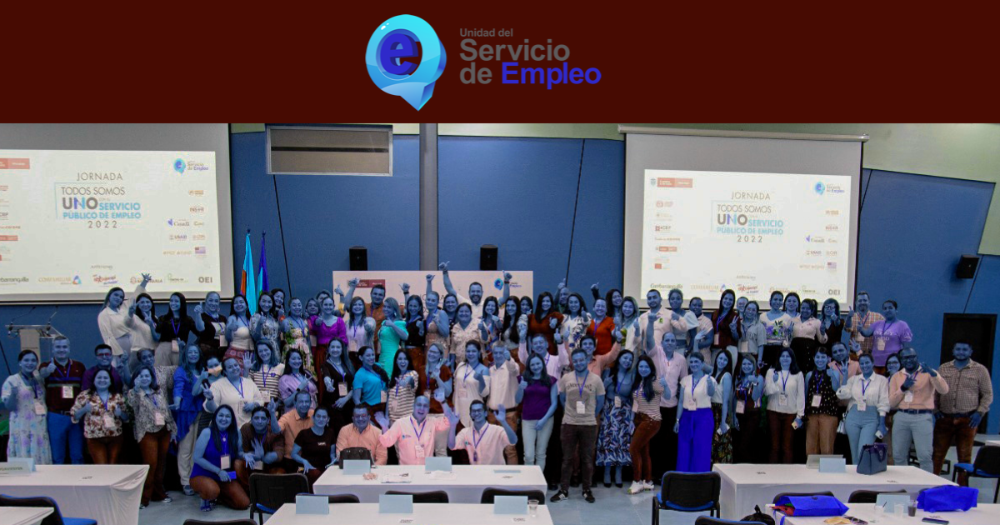

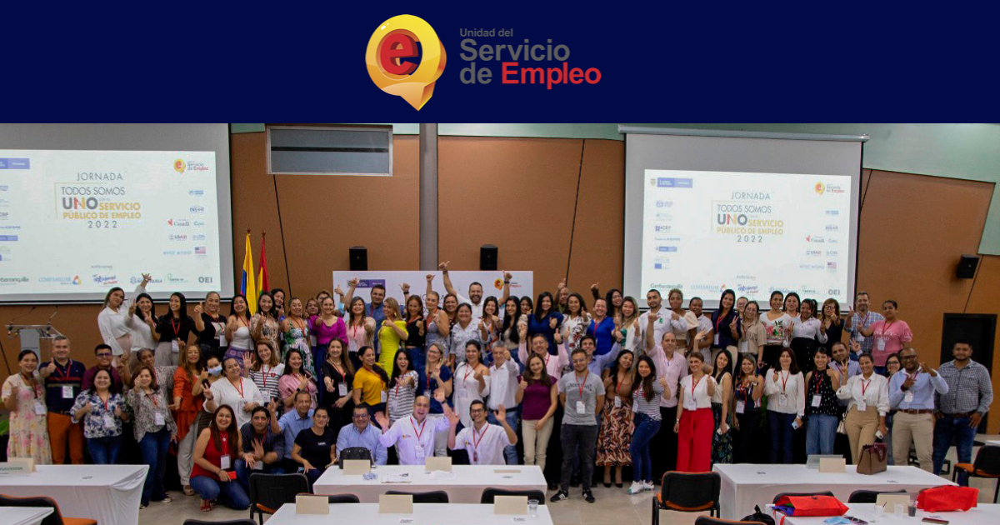

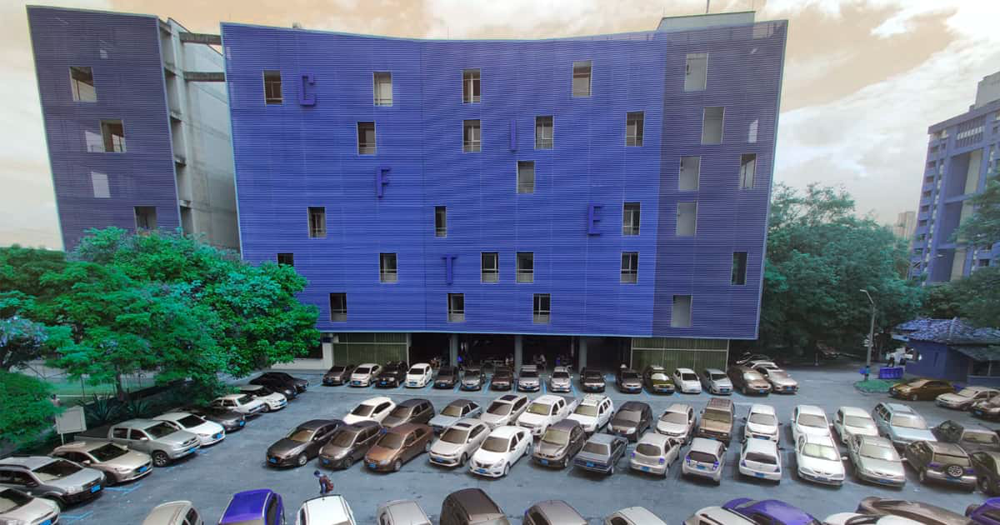

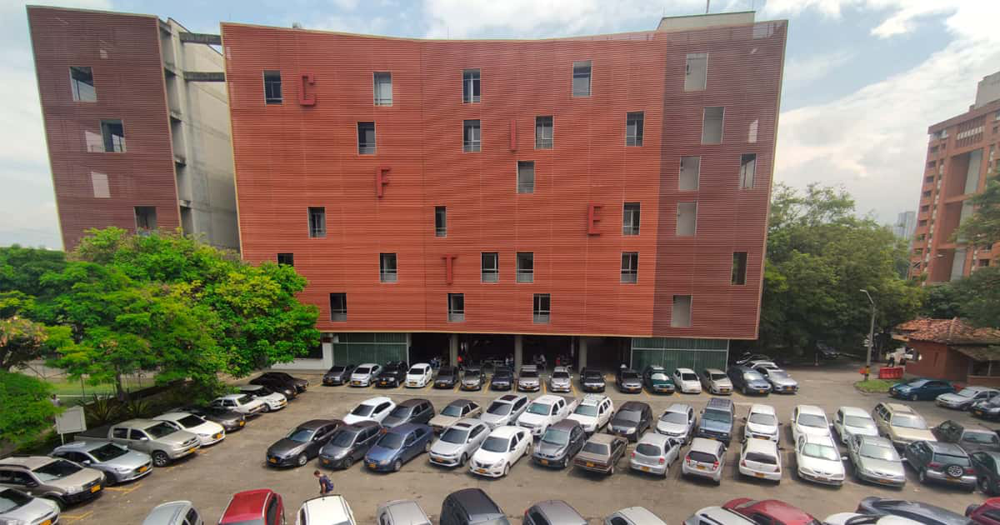

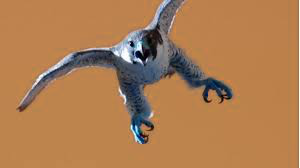

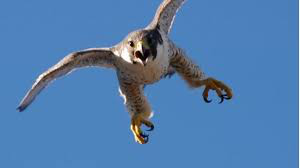

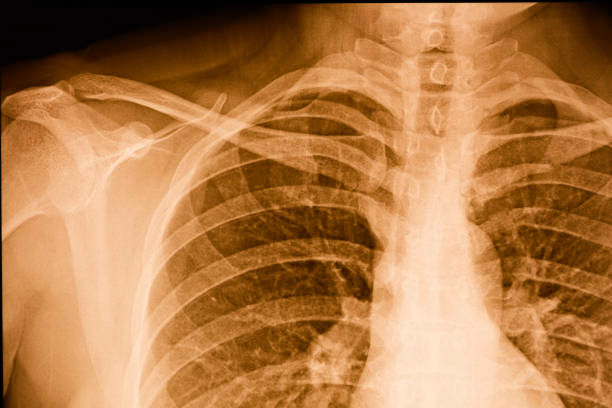

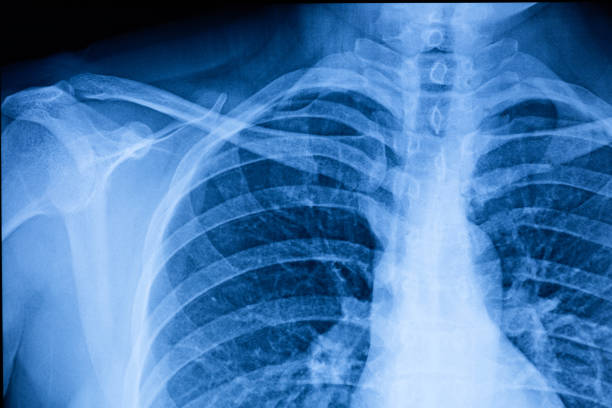

In [ ]:
# Lista de URLs de imágenes
urls = ["https://www.politecnicojic.edu.co/images/fotos/2022/oficina-de-graduados-participa-en-jornada-todos-somos-uno.png",
       "https://www.politecnicojic.edu.co/images/fotos/2022/pico-y-placa-2022.jpg",
        "pruebaHalcon.jfif",
        "https://media.istockphoto.com/photos/human-thoracic-cavity-xray-film-picture-id1212285302?k=20&m=1212285302&s=612x612&w=0&h=B-_y6dP3yy_bLKCmXxpXkS8tH-eAqlUrXHUGALrvutM="]  
# For sobre las URLs para leer y visualizar imágenes
# Suba una imagen al directorio local de la máquina virtual y agregue el nombre a la lista urls
for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB) #convierte formato GBR a RGB
  cv2_imshow(image)
  print('\n')
  cv2_imshow(image_2)

### Ejercicio

Visualice las imágenes en tonos de gris.

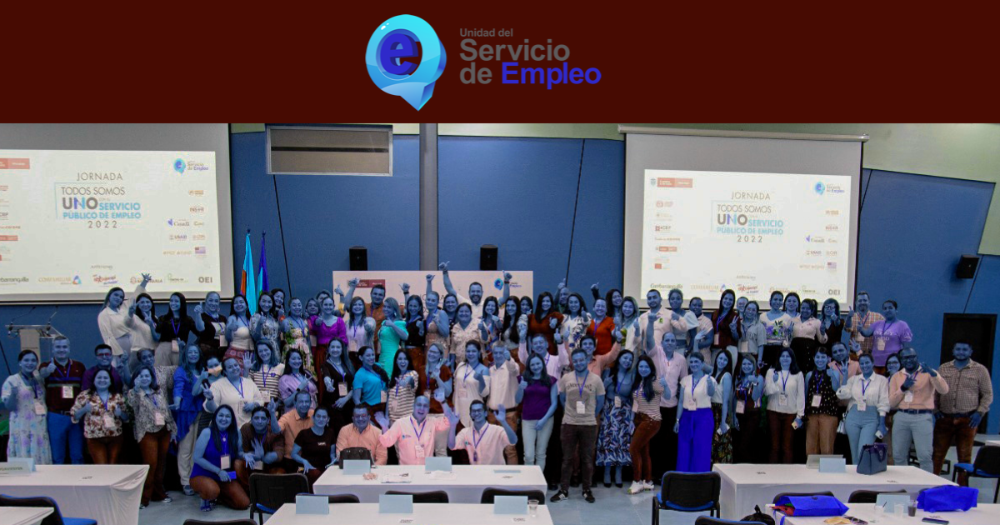

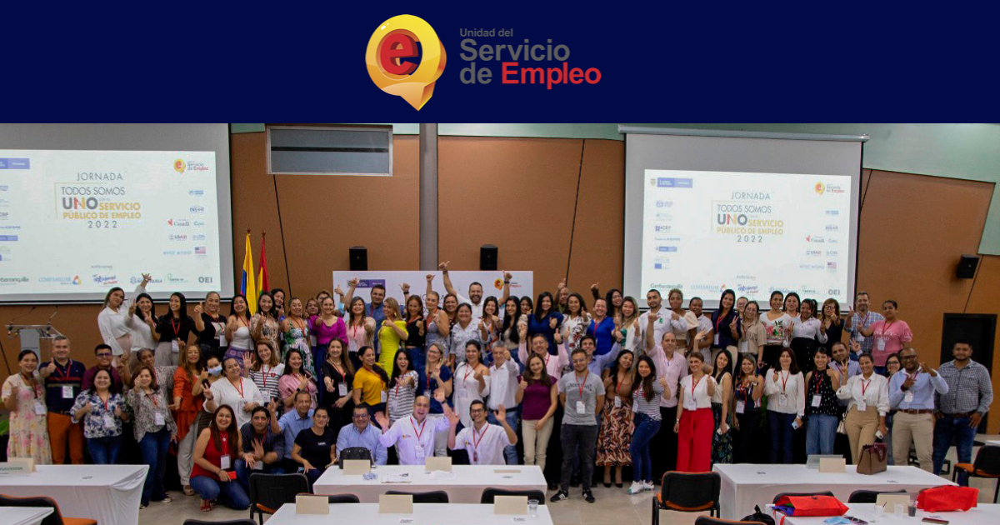

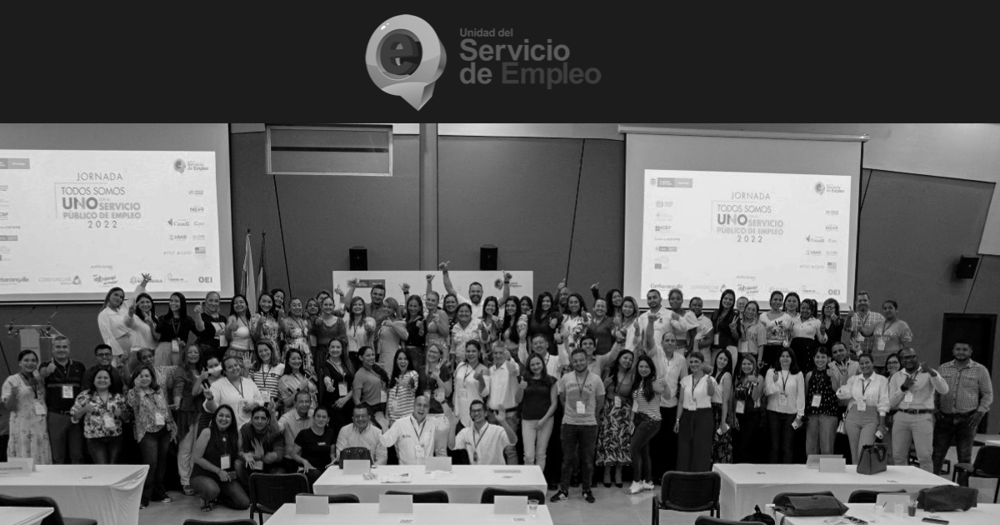

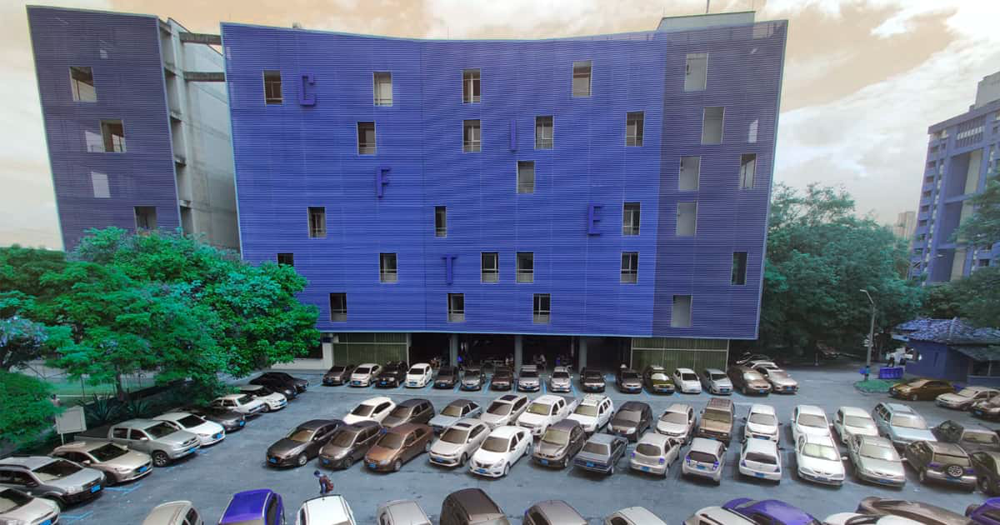

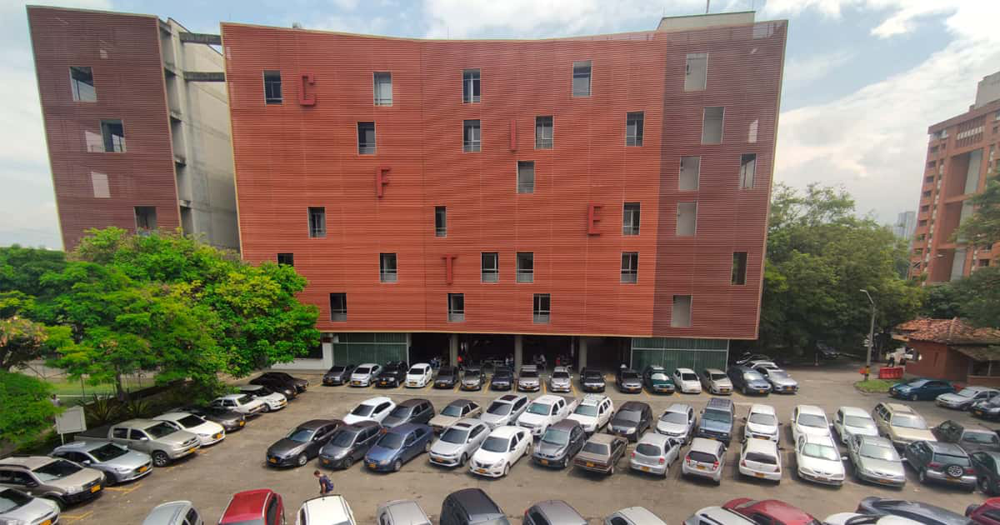

...

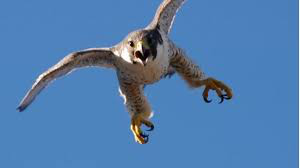

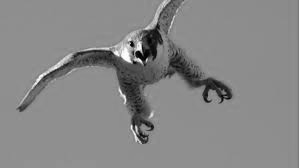

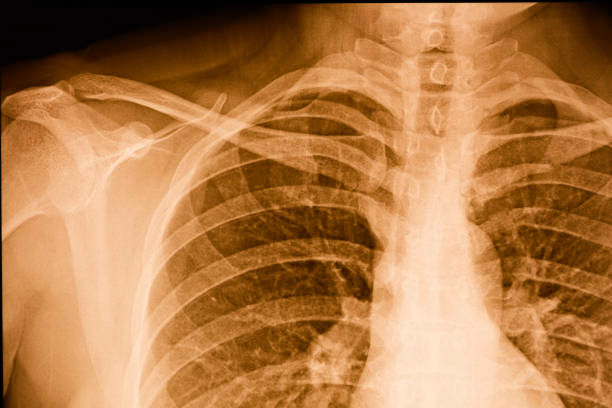

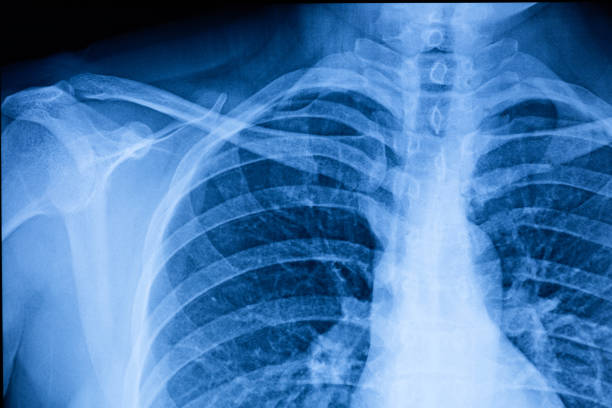

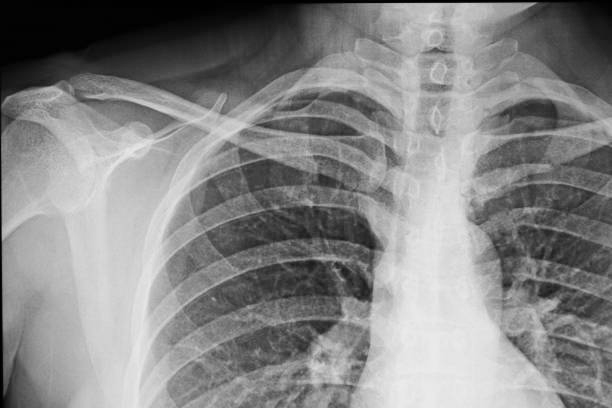

In [ ]:
# Escriba su código
for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB) #convierte formato GBR a RGB
  image_3 = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  cv2_imshow(image)
  print('\n')
  cv2_imshow(image_2)
  print('\n')
  cv2_imshow(image_3)

## Datos básicos de una imagen

Una imagen a color se escribe como una matriz de 3 dimensiones en donde cada celda contiene un número (generalmente entero) que representa cuán intenso es un color primario en esa ubicación.

![RGB](https://upload.wikimedia.org/wikipedia/en/2/23/Matl.jpg)

Verifique tamaño y formato de la imagen.

In [ ]:
# Tipo de datos en la imagen
print(image.dtype)
# Alto , Ancho de la imagen en píxeles , Número de canales de la imagen
print(image.shape)
print(image.size)

uint8
(408, 612, 3)
749088


## Visualizaciones

El sistema de coordenadas de píxeles en la imagen tiene origen arriba a la izquierda.

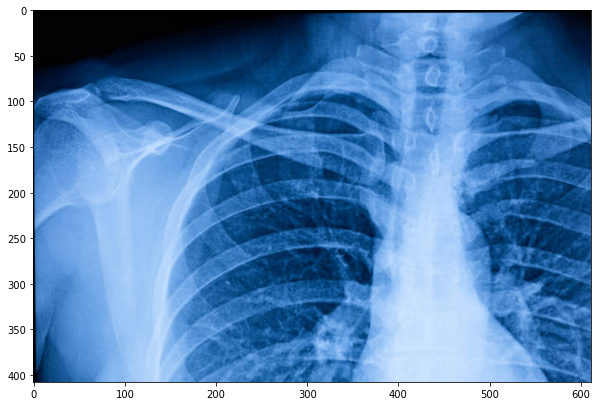

In [ ]:
plt.figure(figsize = (10,10))
plt.imshow(image)
# cv2_imshow(image)

Las bandas pueden separarse.  El valor de un píxel en una banda determinada se relaciona con la intensidad en esa longitud de onda.

(408, 612)

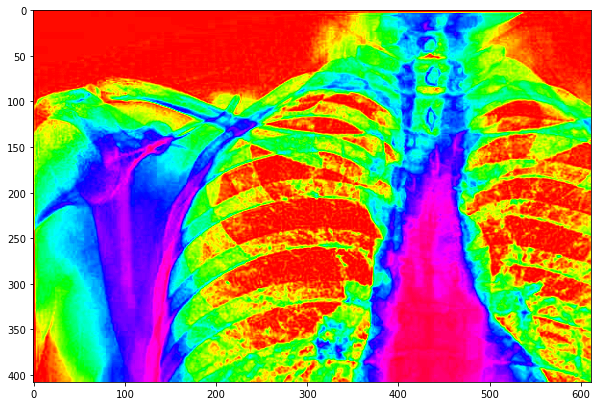

In [ ]:
# split channels
b,g,r=cv.split(image)
# show one of the channels (this is red - see that the sky is kind of dark. try changing it to b)
plt.figure(figsize = (10,10))
plt.imshow(b, cmap='hsv')
r.shape

Imágenes monocromáticas pueden visualizarse con distintos mapas de color.

In [ ]:
COLORflags = [flag for flag in dir(cv) if flag.startswith('COLOR') ]
print(len(COLORflags))
print(COLORflags)


295
['COLORMAP_AUTUMN', 'COLORMAP_BONE', 'COLORMAP_CIVIDIS', 'COLORMAP_COOL', 'COLORMAP_HOT', 'COLORMAP_HSV', 'COLORMAP_INFERNO', 'COLORMAP_JET', 'COLORMAP_MAGMA', 'COLORMAP_OCEAN', 'COLORMAP_PARULA', 'COLORMAP_PINK', 'COLORMAP_PLASMA', 'COLORMAP_RAINBOW', 'COLORMAP_SPRING', 'COLORMAP_SUMMER', 'COLORMAP_TURBO', 'COLORMAP_TWILIGHT', 'COLORMAP_TWILIGHT_SHIFTED', 'COLORMAP_VIRIDIS', 'COLORMAP_WINTER', 'COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_GB2RGB', 'COLOR_BAYER_GB2RGBA', 'COLOR_BAYER_GB2RGB_EA', 'COLOR_BAYER_GB2RGB_VNG', 'COLOR_BAYER_GR2BGR', 'COLOR_BAYER_GR2BGRA', 'COLOR_BAYER_GR2BGR_EA', 'COLOR_BAYER_GR2BGR_VNG', 'COLOR_BAYER_GR2GRAY', 'COLOR_BAYER_GR2RGB', 'COLOR_BAYER_GR2RGBA', 'COL

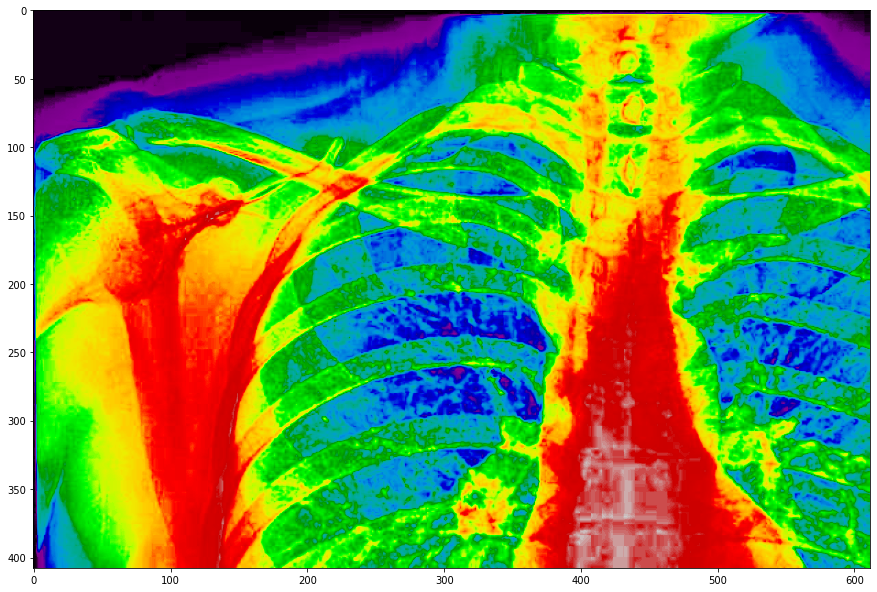

In [ ]:
# show one of the channels (this is red - see that the sky is kind of dark. try changing it to b)
plt.figure(figsize = (15,15))
plt.imshow(g, cmap='nipy_spectral')

In [ ]:
image = io.imread( "pruebaHalcon.jfif")
image = io.imread( "https://www.politecnicojic.edu.co/images/fotos/2022/pico-y-placa-2022.jpg")

b,g,r=cv.split(image)


Puede mezclar imagenes de distintas longitudes de onda para formar imágenes con color.

(630, 1200, 3)

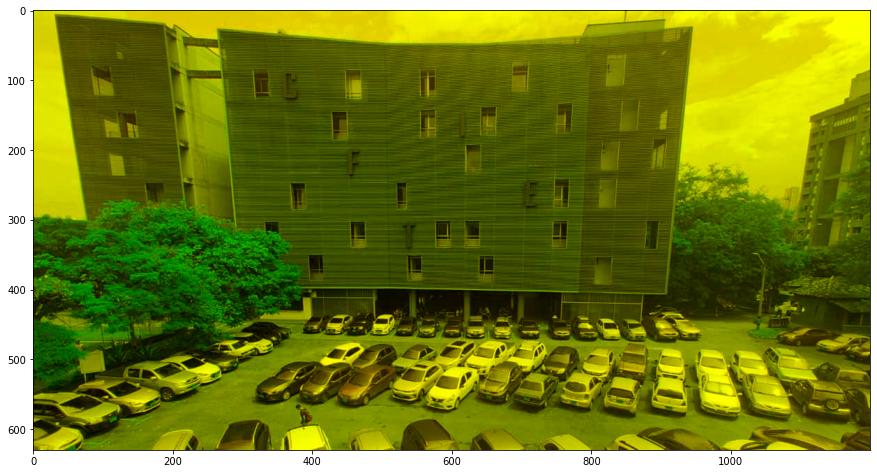

In [ ]:
merged=cv.merge([r,g,0*g])
# merge takes an array of single channel matrices
plt.figure(figsize = (15,15))
plt.imshow(merged)
merged.shape

## Manipulación de imágenes

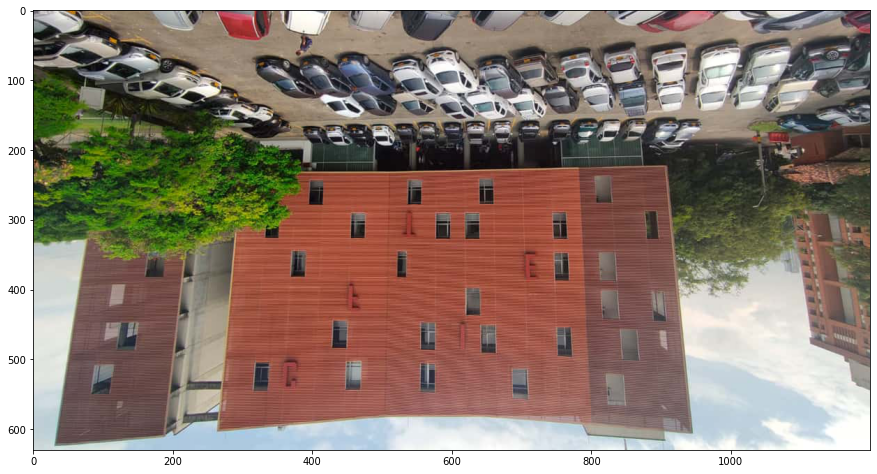

In [ ]:
reflejo_0=cv.flip(image,0) # reflejo vertical
plt.figure(figsize = (15,15))
plt.imshow(reflejo_0)

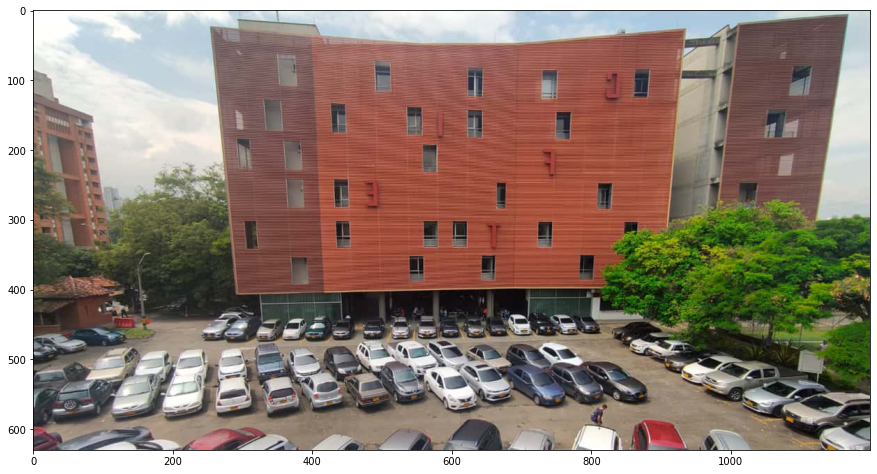

In [ ]:
reflejo_1=cv.flip(image,1) # reflejo horizontal
plt.figure(figsize = (15,15))
plt.imshow(reflejo_1)

¿Qué obtiene al reflejar primero verticalmente y después horizontalmente?

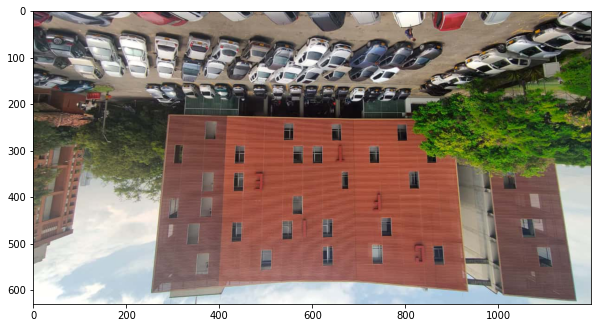

In [ ]:
# Escriba su código
reflejo_2 = cv.flip(cv.flip(image,0),1)
plt.figure(figsize = (10,10))
plt.imshow(reflejo_2)

¿Para qué sirve cv.transpose?



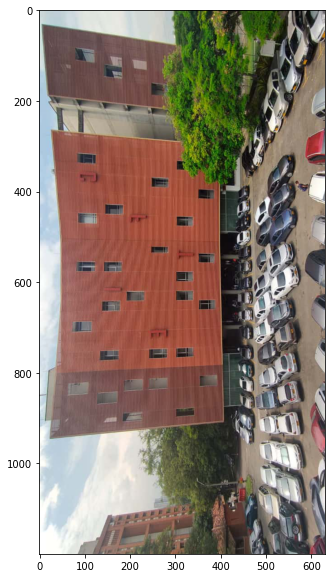

In [ ]:
# Escriba su código
image_trans = cv.transpose(image)
plt.figure(figsize = (10,10))
plt.imshow(image_trans)

In [ ]:
[image.shape[0],image.shape[1]] 

[630, 1200]

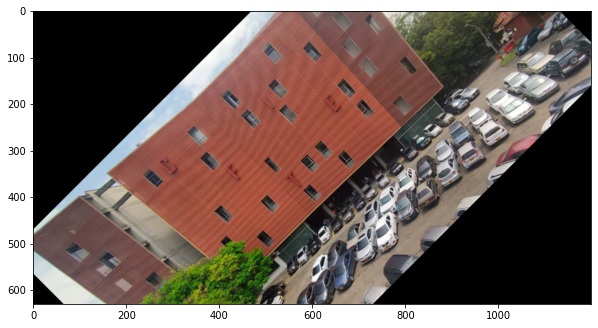

In [ ]:

def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    # image_center = (100,100)
    rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR)
    return result

rotada = rotate_image(image,45)
plt.figure(figsize = (10,10))
plt.imshow(rotada)

## Mínimos y Máximos

In [ ]:
for i in range(0,3):
   min_value, max_value, min_location, max_location=cv.minMaxLoc(image[:,:,i])
   print("banda {}, min {} en {} y max {} en {}".format(i,min_value, min_location, max_value, max_location))

banda 0, min 0.0 en (334, 308) y max 255.0 en (651, 0)
banda 1, min 0.0 en (375, 264) y max 255.0 en (651, 0)
banda 2, min 0.0 en (430, 147) y max 255.0 en (651, 0)


### Ejercicio

Escriba un código que aumente el rango de valores de todas las bandas entre 0 y 255, es decir

## Operaciones aritméticas

Con OpenCV puede realizar operacipnes sobre las imágenes. Numpy tiene instrucciones análogas pero es preferble usar OpenCV.

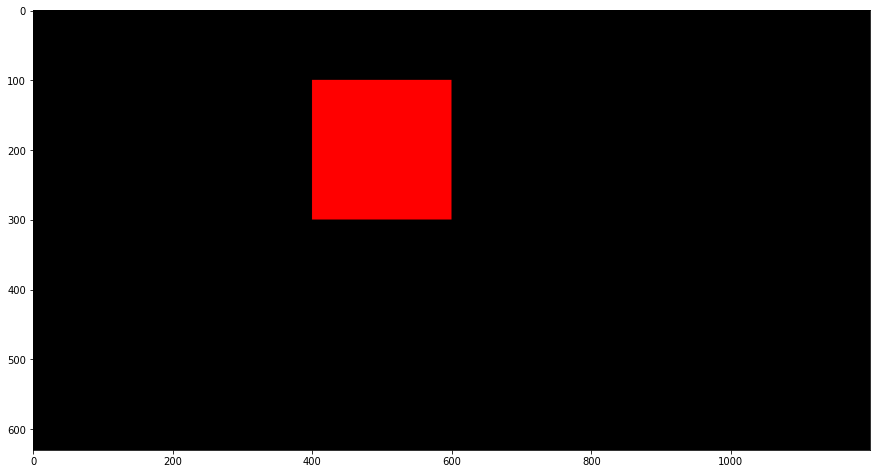

In [ ]:
blank_image = np.zeros((image.shape), np.uint8)

blank_image[100:300,400:600,[0]]=255; #cuadrado con valor 100

new_image=cv.add(blank_image,image) # suma las dos imágenes

plt.figure(figsize = (15,15))
plt.imshow(blank_image)

## Operaciones de vecindad


![RGB](https://www.oreilly.com/library/view/deep-learning-for/9781788295628/assets/71235817-e505-4a48-a72d-2788e57654a8.png)


Los filtros  gaussianos permiten disminuir la presencia de ruido segúnel tamaño del Kernel.

Se usa cv.GaussianBlur para aplicar un filtro gaussiano a las imágenes.  Consulte [https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1)

In [ ]:
help(cv.GaussianBlur)

- Analice la siguiente celda.
- Observe el efecto de cambiar el parámetro $d$.

In [ ]:
d=0
img_blur_d = cv.GaussianBlur(image, (2*d+1, 2*d+1), d)

plt.figure(figsize = (15,15))
plt.imshow(img_blur_d)

## Histogramas

¿Qué información se obtiene en un histograma?.

En una imagen RGB puede generar un histograma por cada canal.

Observe la siguiente celda y analice resultados.

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

¿Qué indica un histograma de una imagen en tonos de gris?

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

In [ ]:

plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

¿Qué valor puede separar el histograma?

Revise la documentación de [`cv.threshold`](https://docs.opencv.org/4.x/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57)

In [ ]:
help(cv.threshold)

In [ ]:
umbral, img_umb = cv.threshold(gray_image,190,255,cv.THRESH_TOZERO)
cv2_imshow(img_umb)

## Final

Ahora puede explorar las funciones y métodos de opencv y ejecutar el código en colaboratory.